In [1]:
import torch
from EchoPulse_pytorch.cvivit import CViViT
from EchoPulse_pytorch.cvivit_trainer import CViViTTrainer
from EchoPulse_pytorch.phenaki_pytorch_ekg import MaskGit, Phenaki
from EchoPulse_pytorch.phenaki_trainer_ekg import PhenakiTrainer

cvivit = CViViT(
    dim=512,  # embedding size
    codebook_size=8192,  # codebook size
    image_size=128,  # H,W
    patch_size=8,  # spatial patch size
    local_vgg=True,
    wandb_mode='disabled',
    temporal_patch_size=2,  # temporal patch size
    spatial_depth=4,  # nb of layers in the spatial transfo
    temporal_depth=4,  # nb of layers in the temporal transfo
    dim_head=64,  # hidden size in transfo
    heads=8,  # nb of heads for multi head transfo
    ff_mult=4,  # 32 * 64 = 2048 MLP size in transfo out
    commit_loss_w=1.,  # commit loss weight
    gen_loss_w=1.,  # generator loss weight
    perceptual_loss_w=1.,  # vgg loss weight
    i3d_loss_w=1.,  # i3d loss weight
    recon_loss_w=10.,  # reconstruction loss weight
    use_discr=0,  # whether to use a stylegan loss or not
    gp_weight=10
    
)


cvivit.load('/pytorch_model.bin')

maskgit = MaskGit(
    num_tokens = 8192,  #set the same number with the codebook_size
    max_seq_len = 2048,
    dim = 512,
    dim_context = 768,
    depth = 6,
)

phenaki = Phenaki(
    cvivit = cvivit,
    maskgit = maskgit
).cuda()

trainer = PhenakiTrainer(
    phenaki = phenaki,
    folder =  '/camus_processed',
    train_on_images = False,
    batch_size = 32,
    grad_accum_every = 1,
    num_frames = 11,
    sample_num_frames = None,
    train_lr = 1e-4,
    train_num_steps = 4000000,
    max_grad_norm = None,
    ema_update_every = 10,
    ema_decay = 0.995,
    adam_betas = (0.9, 0.99),
    wd = 0,
    save_and_sample_every = 5000,
    num_samples = 25,
    results_folder = '/phenaki_results_cos_3type_pre',
    # amp = True,
    fp16 = True,
    split_batches = True,
    convert_image_to = None,
    sample_texts_file_path = '/sorted_files.txt',  # path to a text file with video captions, delimited by newline
    losses_file_folder = '/phenaki_results_cos_3type_pre',
)

trainer.load('9')

/home/local/PARTNERS/yl463/anaconda3/envs/my_phenaki/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/home/local/PARTNERS/yl463/anaconda3/envs/my_phenaki/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/local/PARTNERS/yl463/anaconda3/envs/my_phenaki/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /home/local/PARTNERS/yl463/anaconda3/envs/my_phenaki/lib/python3.8/site-packages/lpips/weights/v0.1/vgg.pth
Load pre-trained checkpoint from: /raid/home/CAMCA/sk1064/ckpt_hub/ecg/st_mem_vit_base.pth
_IncompatibleKeys(missing_keys=['head.weight', 'head.bias'], unexpected_keys=[])
ST_MEM Encoder loaded and frozen successfully.


/home/local/PARTNERS/yl463/anaconda3/envs/my_phenaki/lib/python3.8/site-packages/accelerate/accelerator.py:447: FutureWarning: Passing the following arguments to `Accelerator` is deprecated and will be removed in version 1.0 of Accelerate: dict_keys(['split_batches']). Please pass an `accelerate.DataLoaderConfiguration` instead: 
dataloader_config = DataLoaderConfiguration(split_batches=True)
  warnings.warn(


2000
---------------------------------------------------------------------------------------------------------------------------------


In [2]:
import os
import torch
import numpy as np
from torchvision.io import read_video
import pickle
from glob import glob
from scipy import interpolate
import cv2
from einops import rearrange
from torchvision import transforms as T, utils
import torch.nn.functional as F
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt 


transform_for_videos = T.Compose([
            T.ToPILImage(),  # added to PIL conversion because video is read with cv2
            T.Resize((128,128)),
            # T.RandomHorizontalFlip(),
            # T.CenterCrop(128),
            T.ToTensor()
        ])

def cast_num_frames(t, *, frames):
    f = t.shape[1]
    print ("cast frame ", f)
    if f == frames:
        return t

    if f > frames:
        return t[:, :frames]

    return F.pad(t, (0, 0, 0, 0, 0, frames - f))

def video_to_tensor(
    path: str,
    transform,              # Path of the video to be imported
    num_frames=-1,        # Number of frames to be stored in the output tensor
    crop_size=None
) -> torch.Tensor:          # shape (1, channels, frames, height, width)

    video = cv2.VideoCapture(path)

    frames = []
    check = True
    while check:
        check, frame = video.read()

        if not check:
            continue

        frame = transform(frame)
        frames.append(rearrange(frame, '... -> 1 ...'))

    # convert list of frames to numpy array
    frames = np.array(np.concatenate(frames, axis=0))
    frames = rearrange(frames, 'f c h w -> c f h w')

    frames_torch = torch.tensor(frames).float()

    return frames_torch

def process_ekg(ekg_data, target_length=2250, repetitions=16):
    processed_ekg = np.zeros((12, target_length))
    
    # 원본 데이터를 16번 반복
    repeated_data = np.tile(ekg_data, repetitions)
    
    # 반복된 데이터의 길이
    original_length = len(repeated_data)
    
    if original_length < target_length:
        # Interpolation
        x = np.linspace(0, 1, original_length)
        f = interpolate.interp1d(x, repeated_data, kind='linear')
        x_new = np.linspace(0, 1, target_length)
        processed_ekg[1] = f(x_new)
    elif original_length > target_length:
        # Resampling
        x = np.linspace(0, 1, original_length)
        x_new = np.linspace(0, 1, target_length)
        processed_ekg[1] = np.interp(x_new, x, repeated_data)
    else:
        processed_ekg[1] = repeated_data[:target_length]
    
    return processed_ekg

# EKG 데이터 로드 및 처리 함수
def load_and_process_ekg(ekg_file):
    with open(ekg_file, 'rb') as f:
        ekg_data = pickle.load(f)
    
    # ekg_data의 구조에 따라 적절히 수정
    # 예를 들어, ekg_data가 딕셔너리 형태라고 가정
    ekg = process_ekg(ekg_data)
    
    # NumPy 배열로 변환 (필요한 경우)
    if not isinstance(ekg, np.ndarray):
        ekg = np.array(ekg)
    
    # Z-score 정규화
    ekg = (ekg - np.mean(ekg)) / np.std(ekg)
    
    # 이미 적절한 샘플링 레이트라고 가정. 필요하다면 여기서 리샘플링
    
    return torch.from_numpy(ekg).float().unsqueeze(0)  # (1, length)
def save_video_and_plot_frames(video_tensor, save_dir='output'):
    os.makedirs(save_dir, exist_ok=True)
    B, C, T, H, W = video_tensor.shape
    print(T)
    
    num_rows = (T + 4) // 5  # 5개씩 보여줄 때 필요한 행의 수
    fig, axes = plt.subplots(num_rows, 5, figsize=(20, 4 * num_rows))
    axes = axes.flatten()  # 2D 배열을 1D로 변환
    
    for t in range(T):
        frame = video_tensor[0, :, t, :, :]
        ax = axes[t]
        ax.imshow(frame.permute(1, 2, 0).cpu().numpy())
        ax.set_title(f'Frame {t}')
        ax.axis('off')
    
    # 남은 subplot 숨기기
    for i in range(T, len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()
    # plt.savefig(os.path.join(save_dir, 'all_frames.png'))
    plt.show()
    plt.close()
    
    print(f"All frames plotted in {save_dir}")


def process_ultrasound_image(video_tensor):
    # 입력 텐서의 shape 확인
    B, T, H, W = video_tensor.shape
    
    # 결과를 저장할 텐서 초기화
    result = torch.zeros_like(video_tensor)
    
    for b in range(B):
        for t in range(T):
            # 현재 프레임 추출
            frame = video_tensor[b, t].cpu().numpy()
            
            # 임계값 설정 (이 값은 이미지에 따라 조정이 필요할 수 있습니다)
            threshold = 0.1
            
            # 각 열에서 첫 번째로 임계값을 넘는 픽셀 찾기
            first_pixels = np.argmax(frame > threshold, axis=0)
            
            # 가장 위에 있는 픽셀의 y 좌표 찾기
            top_y = np.min(first_pixels[first_pixels > 0])
            
            # 128x128 크기로 자르기
            cropped = frame[top_y:top_y+128, :128]
            
            # 크기가 128x128이 아닌 경우 인터폴레이션을 사용하여 리사이징
            if cropped.shape != (128, 128):
                cropped = cv2.resize(cropped, (128, 128), interpolation=cv2.INTER_LINEAR)
            
            # 결과 텐서에 저장
            result[b, t] = torch.from_numpy(cropped).float()
    
    return result
def video_tensor_to_gif_with_ekg(video_tensor, ekg_data, output_path, title, duration=125, fps=8):
    # 비디오 텐서를 numpy 배열로 변환
    video_np = video_tensor.numpy()
    
    # 차원 순서 변경 (C, T, H, W) -> (T, H, W, C)
    video_np = np.transpose(video_np, (1, 2, 3, 0))
    
    # EKG 데이터 준비 (차원 축소)
    ekg = ekg_data.cpu().numpy()
    ekg = ekg[0, 1, :]  # Assuming this is the correct dimension for EKG data
    
    # 프레임 수 확인
    
    num_frames = 11
    # EKG 데이터를 프레임 수에 맞게 리샘플링
    x_original = np.linspace(0, 1, len(ekg))
    x_resampled = np.linspace(0, 1, num_frames)
    ekg_resampled = np.interp(x_resampled, x_original, ekg)
    
    # 그림 설정
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 10), gridspec_kw={'height_ratios': [3, 1]})
    
    # 초기 이미지 설정
    im = ax1.imshow(np.zeros((128, 128, 3)), animated=True)
    ax1.set_title(title)
    line, = ax2.plot([], [], 'r-')
    
    ax1.axis('off')
    ax2.set_xlim(0, num_frames)
    ax2.set_ylim(ekg_resampled.min(), ekg_resampled.max())
    ax2.set_xlabel('Frame')
    ax2.set_ylabel('EKG')
    ax2.set_title('Lead II EKG')
    
    # 애니메이션 함수
    def update(frame):
        im.set_array(video_np[frame])
        line.set_data(range(frame+1), ekg_resampled[:frame+1])
        return im, line
    num_frames = video_np.shape[0]
    # 애니메이션 생성
    anim = FuncAnimation(fig, update, frames=num_frames, interval=duration, blit=True)
    
    # GIF로 저장
    anim.save(output_path, writer='pillow', fps=fps)
    plt.close(fig)
    
    print(f"GIF saved to {output_path}")

In [16]:
import cv2
import numpy as np
def process_ekg(ekg_data, target_length=2250, repetitions=16):
    processed_ekg = np.zeros((12, target_length))
    
    # 원본 데이터를 16번 반복
    repeated_data = np.tile(ekg_data, repetitions)
    
    # 반복된 데이터의 길이
    original_length = len(repeated_data)
    
    if original_length < target_length:
        # Interpolation
        x = np.linspace(0, 1, original_length)
        f = interpolate.interp1d(x, repeated_data, kind='linear')
        x_new = np.linspace(0, 1, target_length)
        processed_ekg[1] = f(x_new)
    elif original_length > target_length:
        # Resampling
        x = np.linspace(0, 1, original_length)
        x_new = np.linspace(0, 1, target_length)
        processed_ekg[1] = np.interp(x_new, x, repeated_data)
    else:
        processed_ekg[1] = repeated_data[:target_length]
    if not isinstance(processed_ekg, np.ndarray):
        processed_ekg = np.array(processed_ekg)
    
    # Z-score 정규화
    processed_ekg = (processed_ekg - np.mean(processed_ekg)) / np.std(processed_ekg)
    
    # 이미 적절한 샘플링 레이트라고 가정. 필요하다면 여기서 리샘플링
    
    return torch.from_numpy(processed_ekg).float().unsqueeze(0)  # (1, length)
   
# Load the ECG image
ecg_image_path = 'ecg_page_1.png'  # Adjust the page index based on the correct page number
img = cv2.imread(ecg_image_path, cv2.IMREAD_GRAYSCALE)

# Apply edge detection to highlight the ECG line
edges = cv2.Canny(img, 50, 150)

# Find contours in the image
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Initialize an empty array to store the ECG signal
ecg_signal = []

# Extract the points from the largest contour (assuming it’s the ECG signal)
if contours:
    largest_contour = max(contours, key=cv2.contourArea)
    for point in largest_contour:
        ecg_signal.append(point[0][1])  # Append the Y-coordinate of each point

# Normalize the signal (optional, depending on your use case)
ecg_signal = np.array(ecg_signal)
ecg_signal = (ecg_signal - np.min(ecg_signal)) / (np.max(ecg_signal) - np.min(ecg_signal))
ekg11 = process_ekg(ecg_signal)

In [ ]:
import os
from glob import glob
import torch

# 检查当前设备是 GPU 还是 CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 指定 EKG 样本文件夹
ekg_sample_folder = '/us/cleaned/subset_apical/ekg'
ekg_files = sorted(glob(os.path.join(ekg_sample_folder, '*.pkl')))

# 遍历所有 EKG 文件
for ekg_file in ekg_files:
    try:
        # 加载并处理每个 EKG 文件
        ekg = load_and_process_ekg(ekg_file).to(device)
        
        # 检查 shape 是否为 [1, 12, 2250]
        if ekg.shape != torch.Size([1, 12, 2250]):
            print(f"Shape mismatch in file: {ekg_file} - Shape: {ekg.shape}")
        
        # 检查 EKG 值是否全为 0
        if torch.all(ekg == 0):
            print(f"All zero values in file: {ekg_file}")
    
    except Exception as e:
        # 捕获可能的异常并输出文件名和错误信息
        print(f"Error processing file {ekg_file}: {e}")


In [3]:
def video_tensor_to_gif_with_ekg(video_tensor, ekg_data, output_path, title, duration=125, fps=8):
    # 将视频张量转换为numpy数组
    video_np = video_tensor.numpy()
    
    # 调整维度顺序 (C, T, H, W) -> (T, H, W, C)
    video_np = np.transpose(video_np, (1, 2, 3, 0))
    
    # 准备EKG数据
    ekg = ekg_data.cpu().numpy()
    ekg = ekg[0, 1, :]  # 根据实际数据结构进行调整
    
    # 将EKG数据重新采样为110个点
    # x_original = np.linspace(0, 1, int(len(ekg)/16))
    # x_resampled = np.linspace(0, 1, int(len(ekg)/16))
    # ekg_resampled = np.interp(x_resampled, x_original, ekg)
    ekg_resampled = ekg[0:int(len(ekg)/15)]
    x_ekg = np.linspace(0, 10, int(len(ekg)/15))  # x轴从0到10
    
    # 获取视频帧数
    num_frames = video_np.shape[0]
    step = len(ekg_resampled) // num_frames  # 每帧对应的EKG数据点数

    # 设置图形
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 10), gridspec_kw={'height_ratios': [3, 1]})
    
    # 初始图像设置
    im = ax1.imshow(np.zeros((128, 128, 3)), animated=True)
    ax1.set_title(title)
    line, = ax2.plot([], [], 'r-')
    
    ax1.axis('off')
    ax2.set_xlim(0, 10)
    ax2.set_ylim(ekg_resampled.min(), ekg_resampled.max())
    ax2.set_xlabel('Time (s)')
    ax2.set_ylabel('EKG')
    ax2.set_title('Lead II EKG')
    
    # 动画更新函数
    def update(frame):
        im.set_array(video_np[frame])
        idx = (frame + 1) * step
        if idx > len(ekg_resampled):
            idx = len(ekg_resampled)
        line.set_data(x_ekg[:idx], ekg_resampled[:idx])
        return im, line
    
    # 创建动画
    anim = FuncAnimation(fig, update, frames=num_frames, interval=duration, blit=True)
    
    # 保存为GIF
    anim.save(output_path, writer='pillow', fps=fps)
    plt.close(fig)
    
    print(f"GIF saved to {output_path}")


In [3]:
import torch
import torchvision.transforms as T
from PIL import Image

def video_tensor_to_gif(tensor, path, fps=8, loop=0, optimize=True):
    """
    Converts a video tensor to a GIF file.

    Args:
        tensor (torch.Tensor): Video tensor of shape (C, T, H, W).
        path (str): Output path for the GIF file.
        fps (int): Frames per second for the GIF.
        loop (int): Number of loops for the GIF. 0 means infinite loop.
        optimize (bool): Whether to optimize the GIF size.
    """
    # Ensure tensor is on CPU
    tensor = tensor.cpu()

    # Convert tensor shape from (C, T, H, W) to (T, C, H, W)
    tensor = tensor.permute(1, 0, 2, 3)

    # Clamp tensor values to [0, 1]
    tensor = torch.clamp(tensor, min=0, max=1)

    # Convert each frame to PIL Image
    images = [T.ToPILImage()(frame) for frame in tensor]

    # Calculate duration per frame in milliseconds
    duration = int(1000 / fps)

    # Save the frames as a GIF
    first_img, *rest_imgs = images
    first_img.save(
        path,
        format='GIF',
        save_all=True,
        append_images=rest_imgs,
        duration=duration,
        loop=loop,
        optimize=optimize
    )

    print(f"GIF saved to {path}")




In [ ]:
ekg11

In [ ]:
ekg.shape

In [ ]:
plt.plot(ekg.cpu().numpy()[0][1][:int(2250/15)])
plt.show()

In [ ]:
video_files

cast frame  22


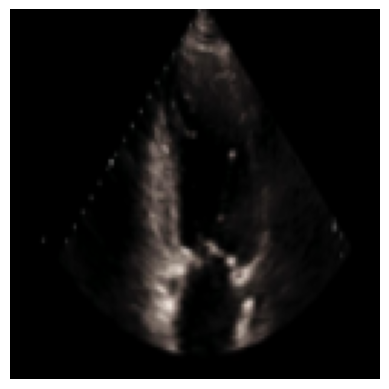

CHCK  1
EXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekg torch.Size([1, 12, 2250])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
Video shape: torch.Size([1, 3, 22, 128, 128])
EKG1 shape: torch.Size([1, 12, 2250])
22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

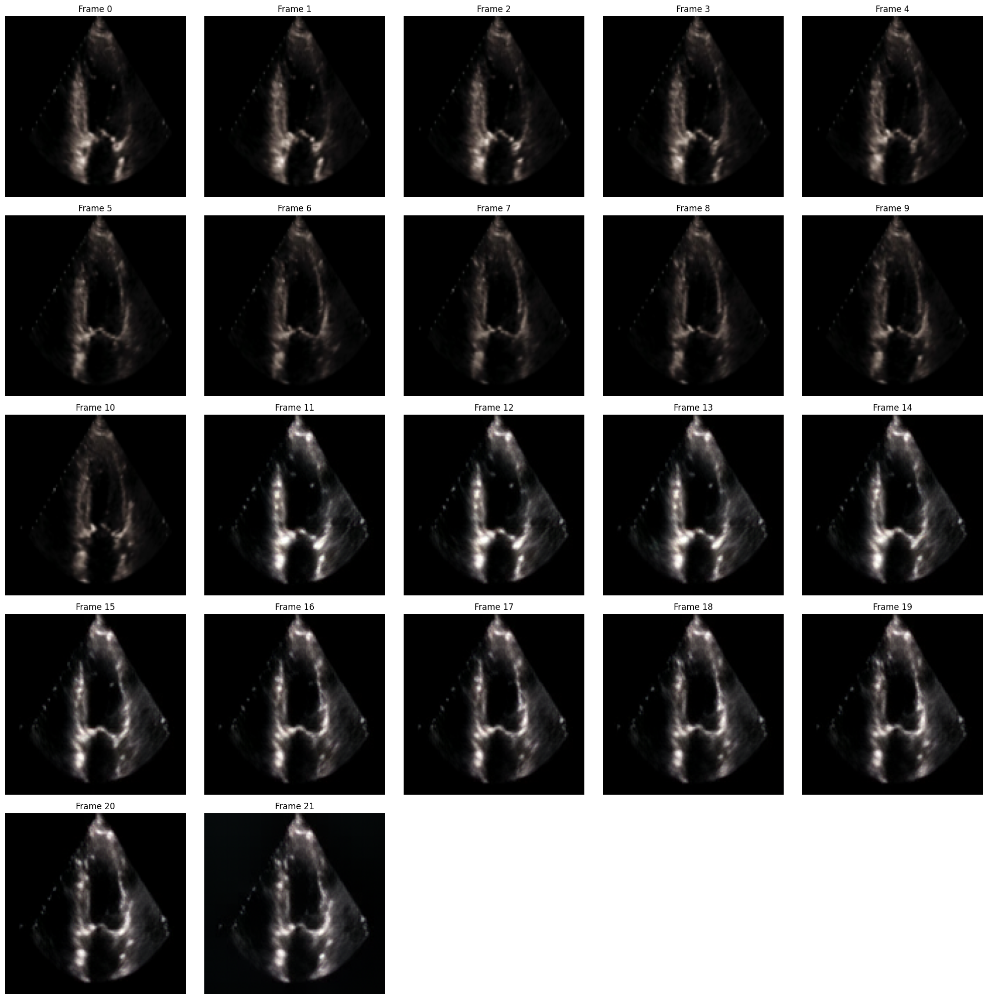

All frames plotted in output
torch.Size([1, 3, 22, 128, 128])
GIF saved to /raid/home/CAMCA/yl463/Video/TestDataApical_embedding_mixing/gt/A2C.USm.1.2.840.114089.1.0.1.2887499449.1641693197.4144.100977_1_23.mp4.gif
GIF saved to /raid/home/CAMCA/yl463/Video/TestDataApical_embedding_mixing/pred/A2C.USm.1.2.840.114089.1.0.1.2887499449.1641693197.4144.100977_1_23.mp4_pred.gif
cast frame  23


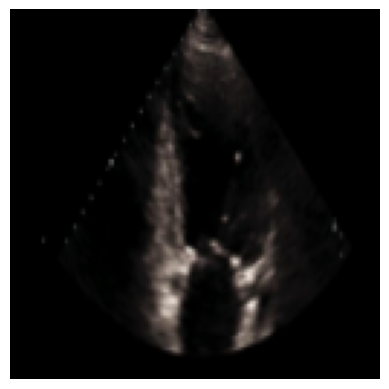

CHCK  1
EXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekg torch.Size([1, 12, 2250])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
Video shape: torch.Size([1, 3, 22, 128, 128])
EKG1 shape: torch.Size([1, 12, 2250])
22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

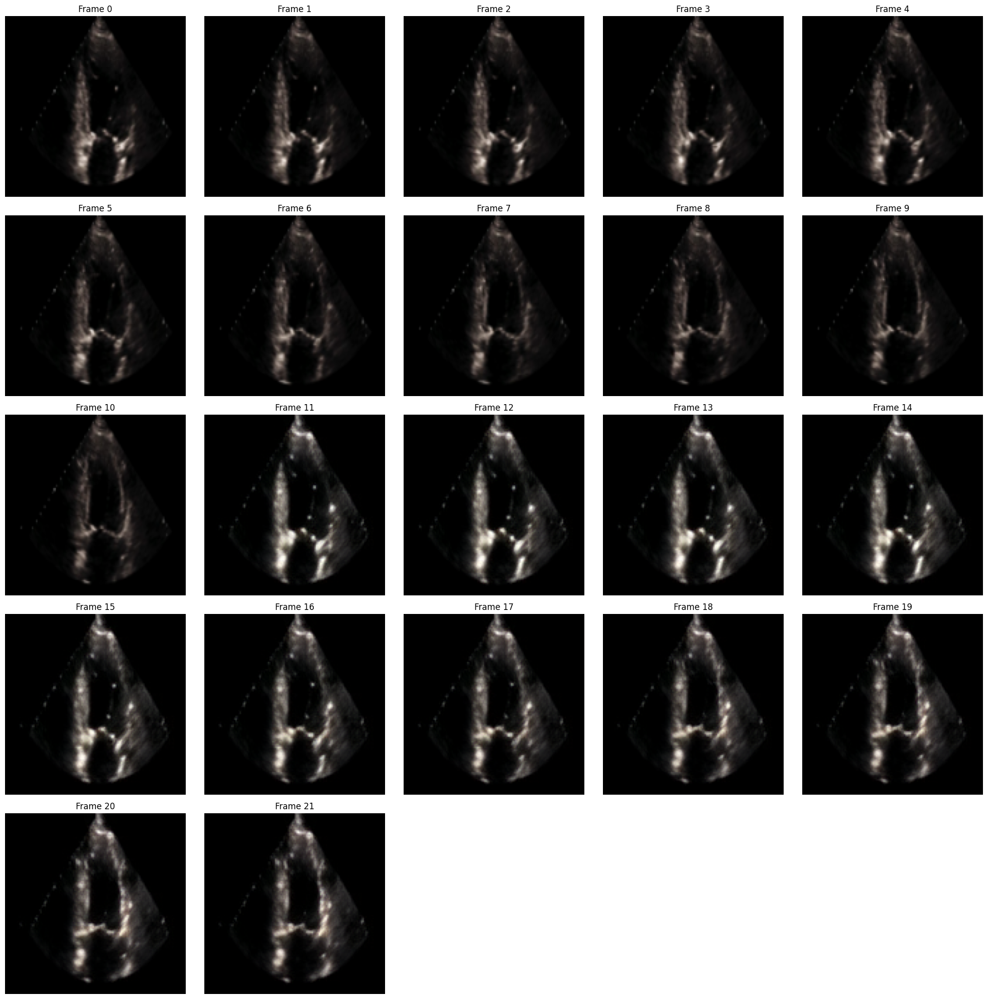

All frames plotted in output
torch.Size([1, 3, 22, 128, 128])
GIF saved to /raid/home/CAMCA/yl463/Video/TestDataApical_embedding_mixing/gt/A2C.USm.1.2.840.114089.1.0.1.2887499449.1641693197.4144.100977_23_46.mp4.gif
GIF saved to /raid/home/CAMCA/yl463/Video/TestDataApical_embedding_mixing/pred/A2C.USm.1.2.840.114089.1.0.1.2887499449.1641693197.4144.100977_23_46.mp4_pred.gif
cast frame  21


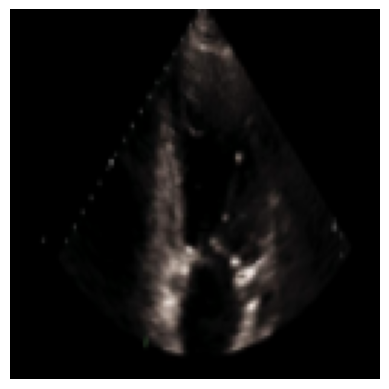

CHCK  1
EXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekg torch.Size([1, 12, 2250])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
Video shape: torch.Size([1, 3, 22, 128, 128])
EKG1 shape: torch.Size([1, 12, 2250])
22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

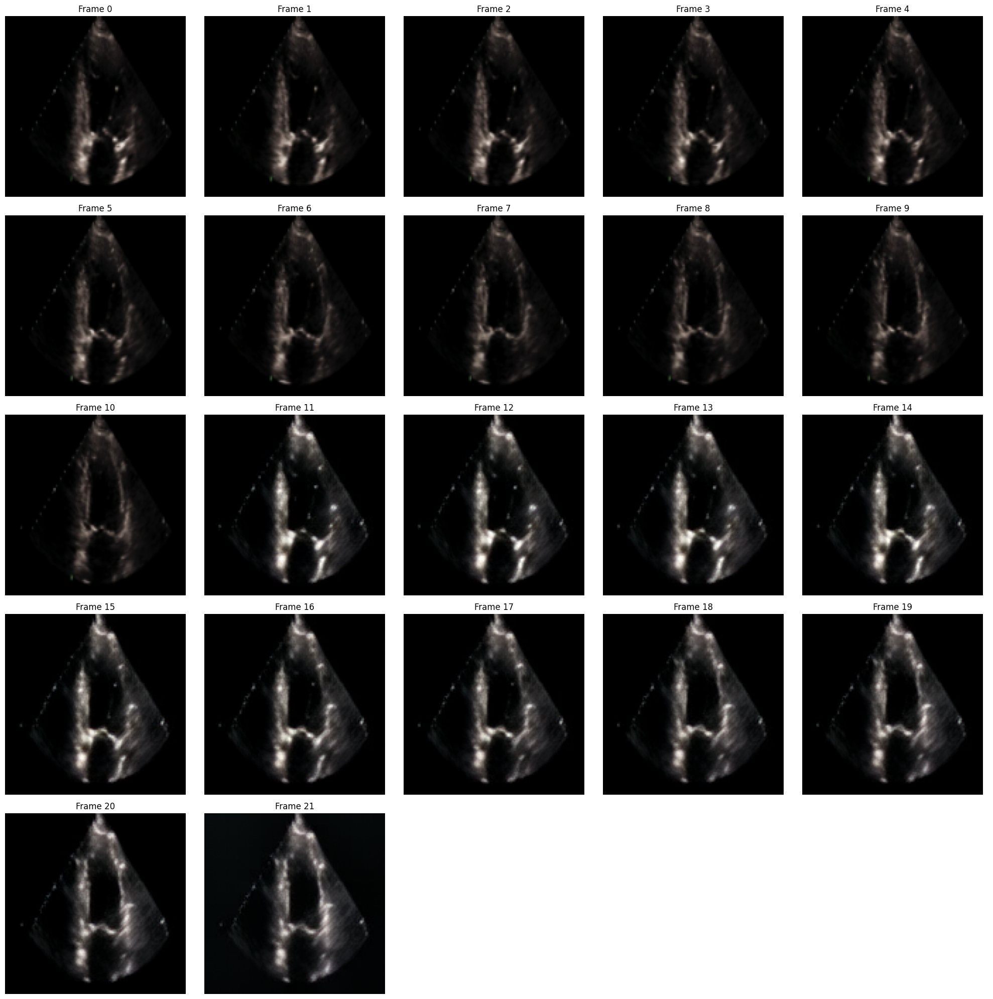

All frames plotted in output
torch.Size([1, 3, 22, 128, 128])
GIF saved to /raid/home/CAMCA/yl463/Video/TestDataApical_embedding_mixing/gt/A2C.USm.1.2.840.114089.1.0.1.2887499449.1641693197.4144.100977_46_67.mp4.gif
GIF saved to /raid/home/CAMCA/yl463/Video/TestDataApical_embedding_mixing/pred/A2C.USm.1.2.840.114089.1.0.1.2887499449.1641693197.4144.100977_46_67.mp4_pred.gif
cast frame  29


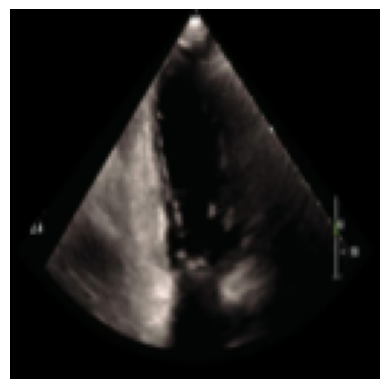

CHCK  1
EXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekg torch.Size([1, 12, 2250])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
Video shape: torch.Size([1, 3, 22, 128, 128])
EKG1 shape: torch.Size([1, 12, 2250])
22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

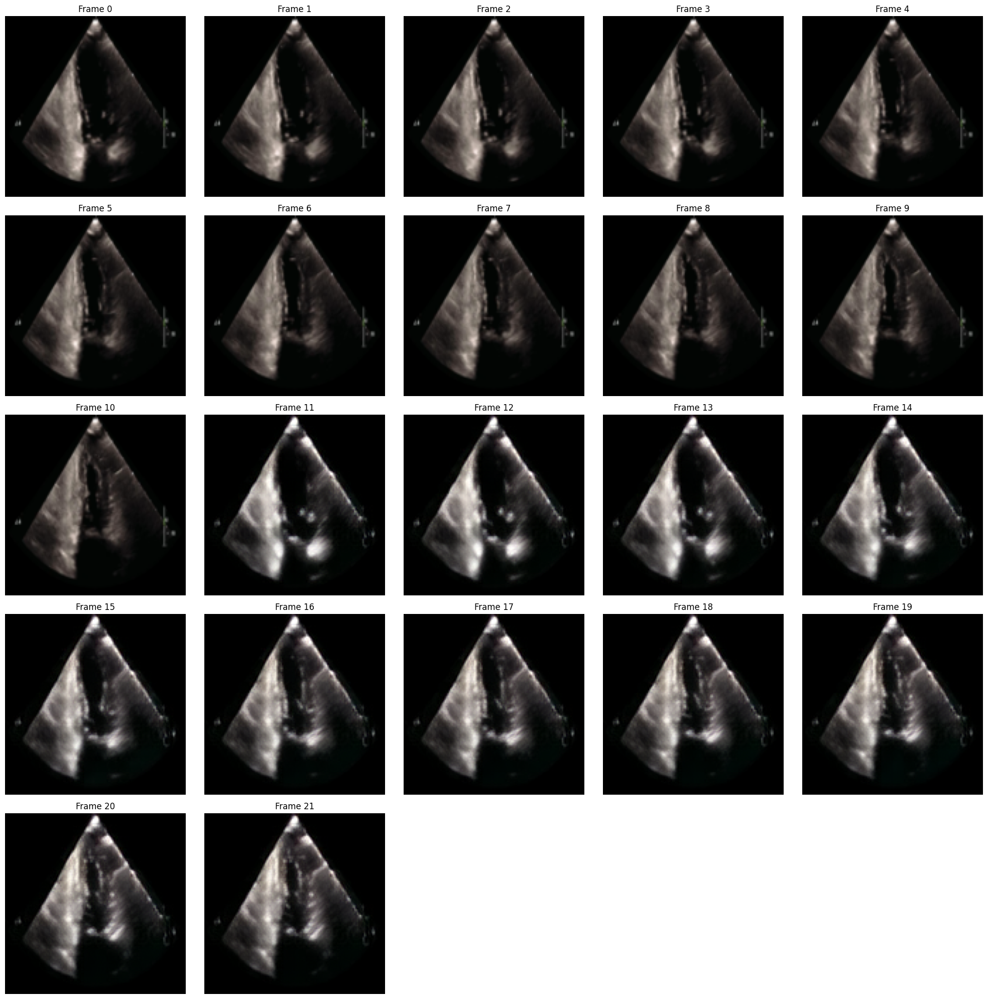

All frames plotted in output
torch.Size([1, 3, 22, 128, 128])
GIF saved to /raid/home/CAMCA/yl463/Video/TestDataApical_embedding_mixing/gt/A2C.USm.1.2.840.114089.1.0.1.2887499449.1641693197.4144.107292_31_60.mp4.gif
GIF saved to /raid/home/CAMCA/yl463/Video/TestDataApical_embedding_mixing/pred/A2C.USm.1.2.840.114089.1.0.1.2887499449.1641693197.4144.107292_31_60.mp4_pred.gif
cast frame  28


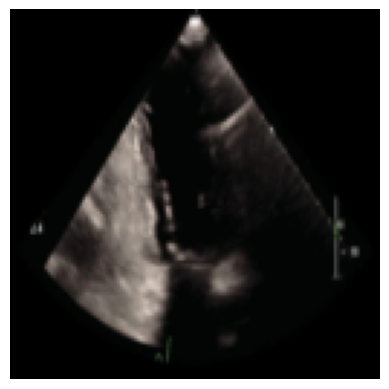

CHCK  1
EXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekg torch.Size([1, 12, 2250])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
Video shape: torch.Size([1, 3, 22, 128, 128])
EKG1 shape: torch.Size([1, 12, 2250])
22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

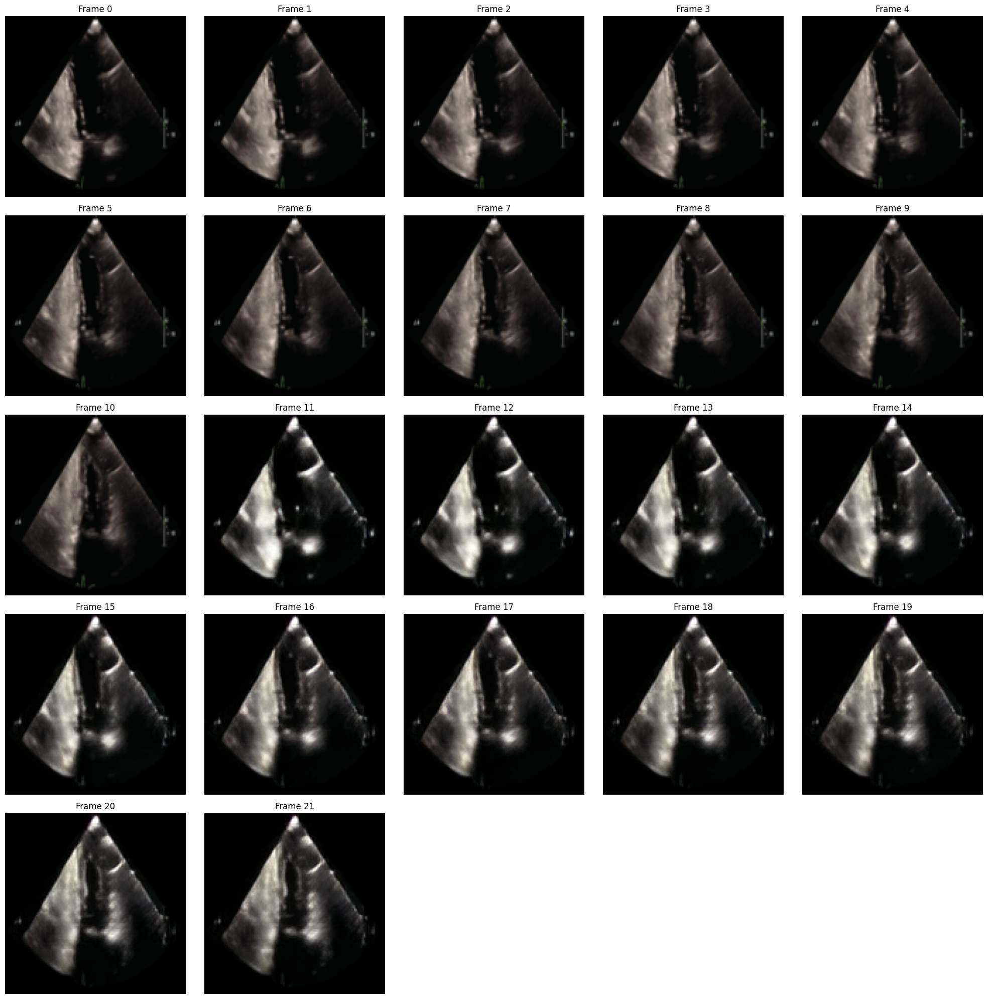

All frames plotted in output
torch.Size([1, 3, 22, 128, 128])
GIF saved to /raid/home/CAMCA/yl463/Video/TestDataApical_embedding_mixing/gt/A2C.USm.1.2.840.114089.1.0.1.2887499449.1641693197.4144.107292_60_88.mp4.gif
GIF saved to /raid/home/CAMCA/yl463/Video/TestDataApical_embedding_mixing/pred/A2C.USm.1.2.840.114089.1.0.1.2887499449.1641693197.4144.107292_60_88.mp4_pred.gif
cast frame  23


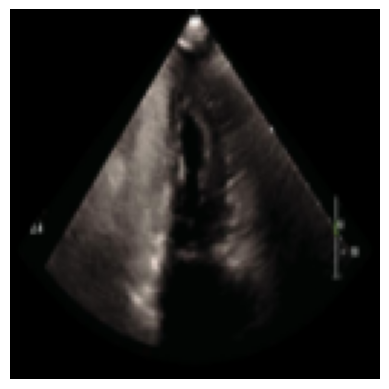

CHCK  1
EXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekgEXIST ekg torch.Size([1, 12, 2250])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
X INPUT  torch.Size([1, 1536])
Video shape: torch.Size([1, 3, 22, 128, 128])
EKG1 shape: torch.Size([1, 12, 2250])
22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

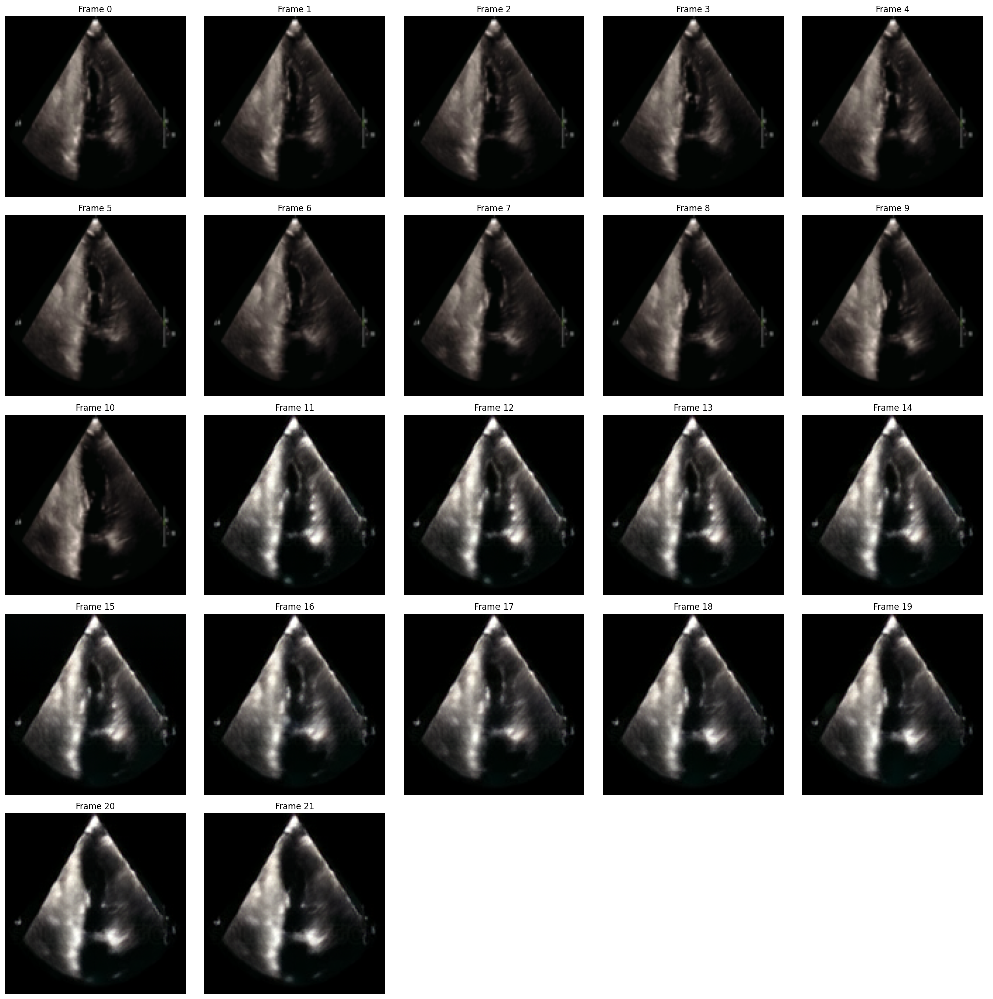

All frames plotted in output
torch.Size([1, 3, 22, 128, 128])
GIF saved to /raid/home/CAMCA/yl463/Video/TestDataApical_embedding_mixing/gt/A2C.USm.1.2.840.114089.1.0.1.2887499449.1641693197.4144.107292_8_31.mp4.gif
GIF saved to /raid/home/CAMCA/yl463/Video/TestDataApical_embedding_mixing/pred/A2C.USm.1.2.840.114089.1.0.1.2887499449.1641693197.4144.107292_8_31.mp4_pred.gif


KeyboardInterrupt: 

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# 비디오 폴더와 EKG 샘플 폴더 설정
video_folder = '/us/cleaned/subset_apical/video/'
ekg_sample_folder = '/us/cleaned/subset_apical/ekg'
ekg_files = sorted(glob(os.path.join(ekg_sample_folder, '*.pkl')))
video_files = sorted(glob(os.path.join(video_folder, '*.mp4')))
phenaki = phenaki.to(device)
for video_idx in range(len(video_files)):
    video = video_to_tensor(video_files[video_idx], transform_for_videos)
    ekg = load_and_process_ekg(ekg_files[video_idx]).to(device)
    video = process_ultrasound_image(video.detach())
    video = cast_num_frames(video, frames=11).unsqueeze(axis=0).to(device)  # (1, 3, T, H, W)
    video_prime = video[:, :, 0:1]
    img = video_prime[0,:,0,:,:].permute(1, 2, 0).cpu().numpy()
    plt.imshow(img)
    plt.axis('off')  
    plt.show()

    # Phenaki를 사용하여 다음 프레임 생성
    video_next = phenaki.sample(
        ekg=ekg,  # 적절한 설명으로 변경
        prime_frames=video_prime.to(device),
        num_frames=10,
        cond_scale=1.
        
    )  # (1, 3, 14, H, W)

    # 전체 비디오 결합
    entire_video = torch.cat((video, video_next), dim=2)  # (1, 3, T+14, H, W)

    print(f"Video shape: {entire_video.shape}")
    print(f"EKG1 shape: {ekg.shape}")

    save_video_and_plot_frames(entire_video)

    print(entire_video.detach().cpu().size())
    #torch.Size([1, 3, 23, 128, 128])   
    video_tensor_to_gif(video[0], f'/gt/{video_files[video_idx].split("/")[-1]}.gif')
    video_tensor_to_gif(video_next[0], f'/pred/{video_files[video_idx].split("/")[-1]}_pred.gif')
    # video_tensor_to_gif_with_ekg(video[0].detach().cpu(), ekg, f'/raid/home/CAMCA/yl463/Video/TestResults912/{video_files[video_idx]}.gif', "gt" , duration=125)
    # video_tensor_to_gif_with_ekg(video_next[0].detach().cpu(), ekg, f'/raid/home/CAMCA/yl463/Video/TestResults912/sample_with_ekg_pred_{video_idx+13}.gif', "pred", duration=125)
    plt.close()
    

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# 비디오 폴더와 EKG 샘플 폴더 설정
video_folder = '/us/cleaned/subset/video/'
ekg_sample_folder = '/us/cleaned/subset/ekg'

video_idx = 10
video_files = sorted(glob(os.path.join(video_folder, '*.mp4')))
video = video_to_tensor(video_files[video_idx], transform_for_videos)

# LOAD EKG
ekg_files = sorted(glob(os.path.join(ekg_sample_folder, '*.pkl')))[:10] 
ekg1, ekg2, ekg3, ekg4 ,ekg5, ekg6, ekg7, ekg8, ekg9 ,ekg10 = [load_and_process_ekg(f).to(device) for f in ekg_files]
ekg = ekg10
video = process_ultrasound_image(video.detach())
video = cast_num_frames(video, frames=11).unsqueeze(axis=0).to(device)  # (1, 3, T, H, W)

phenaki = phenaki.to(device)

# 프라임 프레임 준비
# video_prime = video[:, :, -3:]  # (1, 3, 3, H, W)
video_prime = video[:, :, 0:1]
print ("USED FRAME ",  video_prime.size())
img = video_prime[0,:,0,:,:].permute(1, 2, 0).cpu().numpy()

# 이미지를 표시합니다
plt.imshow(img)
plt.axis('off')  
plt.show()

# Phenaki를 사용하여 다음 프레임 생성
video_next = phenaki.sample(
    ekg=ekg,  # 적절한 설명으로 변경
    prime_frames=video_prime.to(device),
    num_frames=10,
    cond_scale=1.
    
)  # (1, 3, 14, H, W)

# 전체 비디오 결합
entire_video = torch.cat((video, video_next), dim=2)  # (1, 3, T+14, H, W)

print(f"Video shape: {entire_video.shape}")
print(f"EKG1 shape: {ekg.shape}")

save_video_and_plot_frames(entire_video)

print(entire_video.detach().cpu().size())
#torch.Size([1, 3, 23, 128, 128])   
video_tensor_to_gif_with_ekg(video[0].detach().cpu(), ekg, '/Video/sample_with_ekg.gif', "gt" , duration=125)
# video_tensor_to_gif(video[0], '/raid/home/CAMCA/yl463/Video/sample_with_ekg.gif')
video_tensor_to_gif_with_ekg(video_next[0].detach().cpu(), ekg, '/sample_with_ekg_pred.gif', "pred", duration=125)
# video_tensor_to_gif(video_next[0], '/raid/home/CAMCA/yl463/Video/sample_with_ekg_pred.gif')